# ANALYZE DISASTER-RELATED TWEETS
## TEAM 8
### Bao Ngoc Dinh
### Zhichao Lyu
### Haoyan Ou
### Xieqing Jin



In [1]:
### Import packages

import pandas as pd
from nltk.util import ngrams
import pyLDAvis.gensim
import numpy as np
import string
import nltk
import re
import gensim
import seaborn as sns
from gensim import corpora,models
from nltk import FreqDist
#import xgboost as xgb
#import seaborn as sns
import sklearn
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, make_scorer
from gensim.models.word2vec import Word2Vec
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/past/builtins/misc.py:4: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  from collections import Mapping
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/botocore/awsrequest.py:624: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  class HeadersDict(collections.MutableMapping):
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/scipy/sparse/sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


# Import the dataset


In [2]:
df = pd.read_csv('train.csv')

# Text Preprocessing



In [3]:
punct_to_remove = string.punctuation
stoplist = set(stopwords.words('english'))
stemmer = PorterStemmer()

In [4]:
df.head(2)

,id,keyword,location,text,target
0,1,NaN,NaN,Our Deeds are the Reason of this #earthquake M...,1
1,4,NaN,NaN,Forest fire near La Ronge Sask. Canada,1


In [5]:
def text_preprocessing(text):
    text = text.lower()
    text = re.compile(r'http?//\S+|www.\.\S+').sub(r'',text)
    text = text.translate(str.maketrans('','',punct_to_remove))
    text = " ".join([word for word in str(text).split() if word not in stoplist])
    text = " ".join([stemmer.stem(word) for word in text.split()])
    return text

df['text_processed'] = df['text'].apply(text_preprocessing)

df.head()

,id,keyword,location,text,target,text_processed
0,1,NaN,NaN,Our Deeds are the Reason of this #earthquake M...,1,deed reason earthquak may allah forgiv us
1,4,NaN,NaN,Forest fire near La Ronge Sask. Canada,1,forest fire near la rong sask canada
2,5,NaN,NaN,All residents asked to 'shelter in place' are ...,1,resid ask shelter place notifi offic evacu she...
3,6,NaN,NaN,"13,000 people receive #wildfires evacuation or...",1,13000 peopl receiv wildfir evacu order california
4,7,NaN,NaN,Just got sent this photo from Ruby #Alaska as ...,1,got sent photo rubi alaska smoke wildfir pour ...


# Descriptive Analytics

In [6]:
# extract the relevant tweet (target = 1)
df_relevant=df.loc[df['target'] == 1]
df_relevant.head()

,id,keyword,location,text,target,text_processed
0,1,NaN,NaN,Our Deeds are the Reason of this #earthquake M...,1,deed reason earthquak may allah forgiv us
1,4,NaN,NaN,Forest fire near La Ronge Sask. Canada,1,forest fire near la rong sask canada
2,5,NaN,NaN,All residents asked to 'shelter in place' are ...,1,resid ask shelter place notifi offic evacu she...
3,6,NaN,NaN,"13,000 people receive #wildfires evacuation or...",1,13000 peopl receiv wildfir evacu order california
4,7,NaN,NaN,Just got sent this photo from Ruby #Alaska as ...,1,got sent photo rubi alaska smoke wildfir pour ...


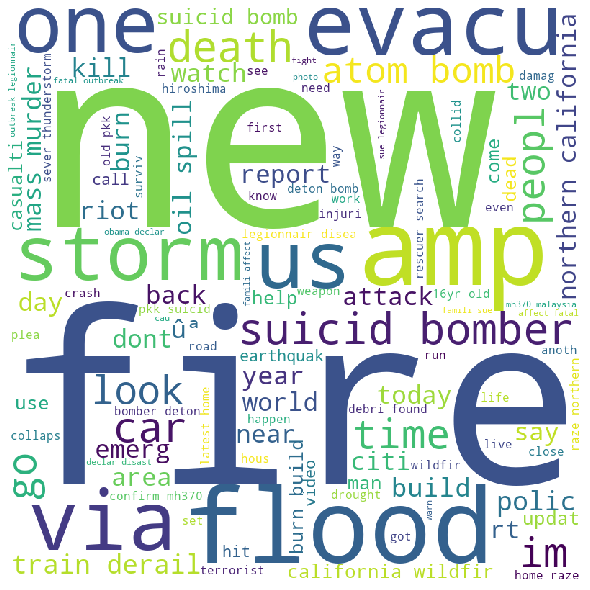

In [7]:
# wordcloud
text = '' 
stopwords = set(STOPWORDS) 
  
for word in df_relevant.text_processed: 
    word = str(word) 
    tokens = word.split()
    text += " ".join(tokens)+" "

wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(text) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
wordcloud.to_file("wordCloud.png")
  
plt.show() 

In [8]:
# graph of most frequent words
df_relevant_text = df_relevant['text_processed']
df_relevant_text_all = df_relevant_text.str.cat(sep=', ')

In [9]:
import collections

relevant_text= df_relevant_text_all.split()

# Create counter
counts_words = collections.Counter(relevant_text)

counts_words.most_common(20)

[('fire', 247),
 ('bomb', 173),
 ('kill', 158),
 ('via', 121),
 ('flood', 116),
 ('news', 116),
 ('california', 114),
 ('suicid', 110),
 ('disast', 109),
 ('crash', 109),
 ('polic', 107),
 ('amp', 106),
 ('famili', 105),
 ('train', 105),
 ('peopl', 103),
 ('attack', 103),
 ('home', 99),
 ('like', 98),
 ('evacu', 94),
 ('build', 93)]

In [10]:
# write to dataframe
freq_count = pd.DataFrame(counts_words.most_common(20),
                             columns=['words', 'count'])

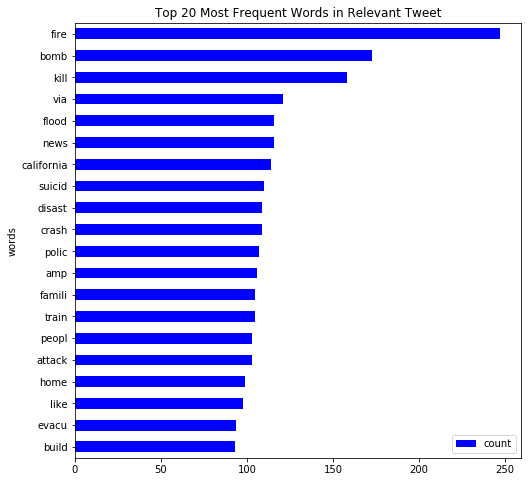

In [11]:
fig, ax = plt.subplots(figsize=(8, 8))

# Plot bar graph
freq_count.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax,
                      color="blue")

ax.set_title("Top 20 Most Frequent Words in Relevant Tweet")

plt.show()

In [12]:
# extract the notrelevant tweet (target = 0)
df_notrelevant=df.loc[df['target'] == 0]
df_notrelevant.head()

,id,keyword,location,text,target,text_processed
15,23,NaN,NaN,What's up man?,0,what man
16,24,NaN,NaN,I love fruits,0,love fruit
17,25,NaN,NaN,Summer is lovely,0,summer love
18,26,NaN,NaN,My car is so fast,0,car fast
19,28,NaN,NaN,What a goooooooaaaaaal!!!!!!,0,goooooooaaaaaal


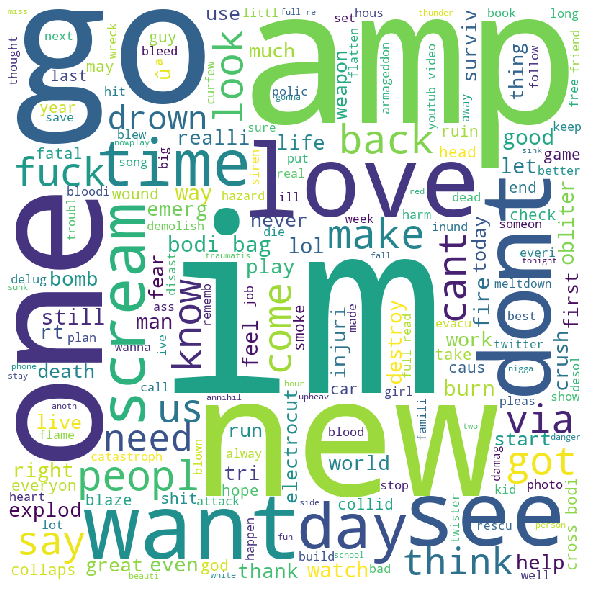

In [13]:
# wordcloud
text = '' 
stopwords = set(STOPWORDS) 
  
for word in df_notrelevant.text_processed: 
    word = str(word) 
    tokens = word.split()
    text += " ".join(tokens)+" "

wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(text) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
wordcloud.to_file("wordCloud2.png")
  
plt.show() 

In [14]:
# graph of most frequent words
df_notrelevant_text = df_notrelevant['text_processed']
df_notrelevant_text_all = df_notrelevant_text.str.cat(sep=', ')

In [15]:
import collections

notrelevant_text= df_notrelevant_text_all.split()

# Create counter
counts_words_2 = collections.Counter(notrelevant_text)

In [16]:
# write to dataframe
freq_count_2 = pd.DataFrame(counts_words_2.most_common(20),
                             columns=['words', 'count'])

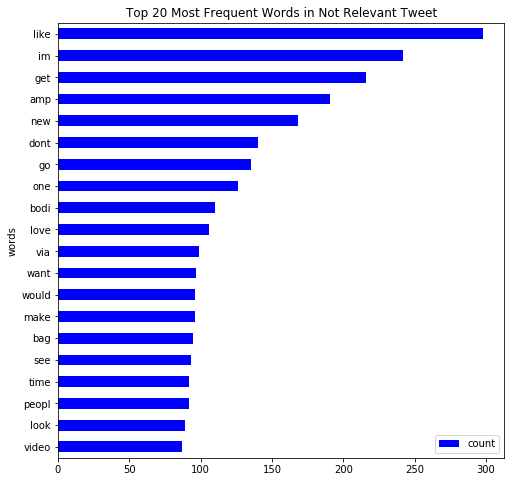

In [17]:
fig, ax = plt.subplots(figsize=(8, 8))

# Plot bar graph
freq_count_2.sort_values(by='count').plot.barh(x='words',
                      y='count',
                      ax=ax,
                      color="blue")

ax.set_title("Top 20 Most Frequent Words in Not Relevant Tweet")

plt.show()

In [18]:
#Use Porter Stemmer 
porter = nltk.PorterStemmer()
stem1 = [porter.stem(w) for w in relevant_text]

In [19]:
# bigrams
bigrams=list(ngrams(stem1,2))
print(len(bigrams))

34956


In [20]:
#Generate a frequency distribution 
freq3 = nltk.FreqDist(bigrams)
sorted_tag_freq_3 = sorted(freq3.items(), key = lambda k:k[1], reverse = True)

<p><b>Graph of 30 most frequent bigrams in 'Relevant' category</b></p>



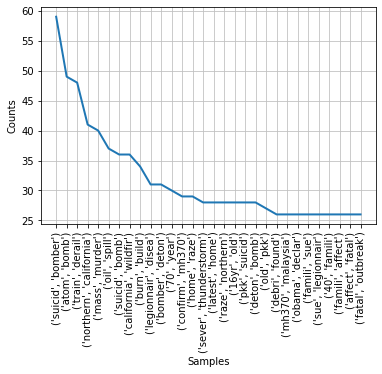

In [21]:
freq3.plot(30)

In [22]:
#Use Porter Stemmer 
porter = nltk.PorterStemmer()
stem2 = [porter.stem(w) for w in notrelevant_text]

In [23]:
bigrams2=list(ngrams(stem2,2))
print(len(bigrams2))

41420


In [24]:
#Generate a frequency distribution 
freq4 = nltk.FreqDist(bigrams2)
sorted_tag_freq_4 = sorted(freq4.items(), key = lambda k:k[1], reverse = True)

<p><b>Graph of 30 most frequent bigrams in 'Not Relevant' category</b></p>

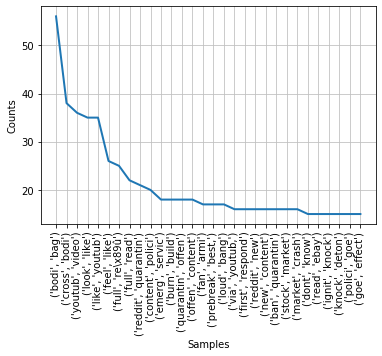

In [25]:
freq4.plot(30)

# Topic Modeling

In [26]:
#convert to list and tokenize
reviews = df['text_processed'].tolist()
tokens_list = [[word for word in review.lower().split(' ') if word.isalpha()]
         for review in reviews]

#remove words that appear only once
from collections import defaultdict
frequency = defaultdict(int)

for tokens in tokens_list:
    for token in tokens:
        frequency[token] += 1
        
tokens_list = [[token for token in tokens if frequency[token]>1]
              for tokens in tokens_list]

In [27]:
#generate token dictionary class
dictionary = corpora.Dictionary(tokens_list) 

# generate a unique token list 
sort_token = sorted(dictionary.items(),key=lambda k:k[0], reverse = False)
unique_token = [token for (ID,token) in sort_token]

# build a corpus
corpus = [dictionary.doc2bow(tokens) for tokens in tokens_list]
#Generate Term Document Matrix
matrix = gensim.matutils.corpus2dense(corpus,num_terms=len(dictionary),dtype = 'int')
matrix = matrix.T #transpose the matrix 

#convert the numpy matrix into pandas data frame
matrix_df = pd.DataFrame(matrix, columns=unique_token)

In [28]:
#Build LDA model
lda = models.LdaModel(corpus, id2word=dictionary, num_topics=10, random_state = 42)

# Generate U Matrix for LDA model
corpus_lda = lda[corpus] #transform lda model

#convert corpus_lda to numpy matrix
U_matrix_lda = gensim.matutils.corpus2dense(corpus_lda,num_terms=10).T

#write U_matrix into pandas dataframe and output
U_matrix_lda_df = pd.DataFrame(U_matrix_lda)

lda.print_topics(10) # Topic matrix (V matrix)

[(0,
  '0.018*"get" + 0.011*"volcano" + 0.010*"like" + 0.010*"video" + 0.010*"amp" + 0.010*"dont" + 0.010*"thunder" + 0.010*"lightn" + 0.009*"go" + 0.009*"smoke"'),
 (1,
  '0.019*"traumatis" + 0.015*"hazard" + 0.015*"zone" + 0.010*"take" + 0.009*"fuck" + 0.009*"fire" + 0.009*"ass" + 0.009*"wreck" + 0.009*"im" + 0.009*"like"'),
 (2,
  '0.030*"suicid" + 0.020*"bomb" + 0.014*"im" + 0.013*"thunderstorm" + 0.011*"saudi" + 0.010*"violent" + 0.010*"nuclear" + 0.010*"water" + 0.010*"like" + 0.009*"mosqu"'),
 (3,
  '0.037*"wreck" + 0.021*"wildfir" + 0.018*"california" + 0.017*"obama" + 0.015*"trauma" + 0.015*"northern" + 0.014*"via" + 0.013*"fire" + 0.013*"reddit" + 0.011*"surviv"'),
 (4,
  '0.031*"storm" + 0.012*"rescu" + 0.012*"surviv" + 0.012*"like" + 0.012*"without" + 0.011*"one" + 0.011*"think" + 0.010*"affect" + 0.010*"wind" + 0.009*"great"'),
 (5,
  '0.023*"releas" + 0.018*"hostag" + 0.013*"trap" + 0.013*"new" + 0.012*"deton" + 0.011*"isi" + 0.011*"armi" + 0.010*"movi" + 0.009*"attack" +

In [29]:
#visualize the outcome of LDA result

pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(lda, corpus, dictionary)

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.098991 -0.001538       1        1  13.206664
9      0.112229  0.067235       2        1  11.254825
0      0.065463  0.056403       3        1  11.103199
7      0.116975 -0.057763       4        1  10.679742
4      0.034616  0.092543       5        1   9.519495
6     -0.049933  0.055263       6        1   9.475685
8     -0.061699 -0.146367       7        1   9.356953
3     -0.246861  0.123792       8        1   8.704679
5     -0.077523 -0.213724       9        1   8.485800
1      0.007742  0.024156      10        1   8.212951, topic_info=     Category        Freq    Term       Total  loglift  logprob
560   Default  238.000000   wreck  238.000000  30.0000  30.0000
1218  Default  254.000000  suicid  254.000000  29.0000  29.0000
888   Default  217.000000   storm  217.000000  28.0000  28.0000
1944  Default  195.000000   wound  195.000000  27.0000  27.0000
3067  Default  120.000000   fatal  120.000000  26.0000  26.0000
...       ...         ...     ...         ...      ...      ...
270   Topic10   32.786736    dont  204.077393   0.6710  -5.0078
174   Topic10   25.340803  follow   57.653389   1.6774  -5.2654
492   Topic10   27.602482     say  145.856812   0.8347  -5.1799
513   Topic10   27.512688    news  233.523895   0.3608  -5.1832
6     Topic10   24.488001      us  169.537003   0.5646  -5.2996

[611 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
121       6  0.961123      aba
3407      1  0.891515      abc
3407      4  0.077523      abc
2294      7  0.960110   accord
2651      5  0.898824  account
...     ...       ...      ...
466       6  0.105383   youtub
466       8  0.028741   youtub
466      10  0.095802   youtub
831      10  0.988813     zone
2958      7  0.879164       åê

[1525 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 10, 1, 8, 5, 7, 9, 4, 6, 2])

# Sentiment Analysis

<p> In this part, we hope to do a sentiment analysis on the dataset. We will split the dataset into 'Relevant' and 'Not Relevant' dataset, and compare the sentiment between the two target categories. We also hope to compare the list of 30 most important words in the two target categories. We will also construct the list of 30 most important bigrams in the two target categories

In [30]:
df_review=df['text']

In [31]:
df_review.head()

0    Our Deeds are the Reason of this #earthquake M...
1               Forest fire near La Ronge Sask. Canada
2    All residents asked to 'shelter in place' are ...
3    13,000 people receive #wildfires evacuation or...
4    Just got sent this photo from Ruby #Alaska as ...
Name: text, dtype: object

In [32]:
def nltk_sentiment(sentence):
    from nltk.sentiment.vader import SentimentIntensityAnalyzer
    
    nltk_sentiment = SentimentIntensityAnalyzer()
    score = nltk_sentiment.polarity_scores(sentence)
    return score

In [33]:
nltk_results = [nltk_sentiment(row) for row in df_review]
results_df = pd.DataFrame(nltk_results)
text_df = pd.DataFrame(df_review)
nltk_df = text_df.join(results_df)

nltk_df.head()

,text,neg,neu,pos,compound
0,Our Deeds are the Reason of this #earthquake M...,0.000,0.851,0.149,0.2732
1,Forest fire near La Ronge Sask. Canada,0.286,0.714,0.000,-0.3400
2,All residents asked to 'shelter in place' are ...,0.095,0.905,0.000,-0.2960
3,"13,000 people receive #wildfires evacuation or...",0.000,1.000,0.000,0.0000
4,Just got sent this photo from Ruby #Alaska as ...,0.000,1.000,0.000,0.0000


In [34]:
#output only csv
nltk_df.to_csv('sentiment_output_vader_disaster.csv')

In [35]:
result = pd.merge(df,nltk_df, on='text')

result

result.head()

,id,keyword,location,text,target,text_processed,neg,neu,pos,compound
0,1,NaN,NaN,Our Deeds are the Reason of this #earthquake M...,1,deed reason earthquak may allah forgiv us,0.000,0.851,0.149,0.2732
1,4,NaN,NaN,Forest fire near La Ronge Sask. Canada,1,forest fire near la rong sask canada,0.286,0.714,0.000,-0.3400
2,5,NaN,NaN,All residents asked to 'shelter in place' are ...,1,resid ask shelter place notifi offic evacu she...,0.095,0.905,0.000,-0.2960
3,6,NaN,NaN,"13,000 people receive #wildfires evacuation or...",1,13000 peopl receiv wildfir evacu order california,0.000,1.000,0.000,0.0000
4,7,NaN,NaN,Just got sent this photo from Ruby #Alaska as ...,1,got sent photo rubi alaska smoke wildfir pour ...,0.000,1.000,0.000,0.0000


In [36]:
#output only csv
result.to_csv('result_vader_disaster.csv')

### MEAN PER TARGET- Sentiment Ânalysis

In [37]:
table = pd.pivot_table(result, values=['neg','neu','pos','compound'], index='target', aggfunc=np.mean)
table

,compound,neg,neu,pos
target,,,,
0,-0.060126,0.132040,0.766153,0.101816
1,-0.271900,0.175322,0.775614,0.049070


Text(0.5, 0.98, 'Distribution of Sentiment')

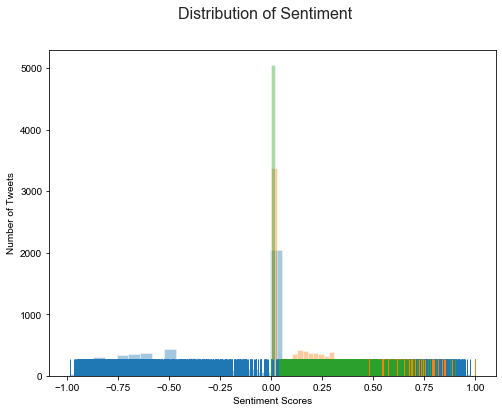

In [38]:
# a simple plot to look into the sentences 


a4_dims = (8, 6)
fig, ax = plt.subplots(figsize=a4_dims)

sns.set(color_codes=True)
sns.distplot(result['compound'], ax=ax, kde=False, rug=True) # blue
sns.distplot(result['neg'], ax=ax, kde=False, rug=True) # yello
sns.distplot(result['pos'], ax=ax, kde=False, rug=True) # green 

plt.xlabel('Sentiment Scores')
plt.ylabel('Number of Tweets')
plt.suptitle('Distribution of Sentiment', fontsize=16)

# Train Test Split



In [39]:
x = df['text_processed']
y = df['target']

x_train, x_val, y_train, y_val = train_test_split(x,y,test_size = 0.2,random_state=42) #80/20 train/test split

vectorizer = TfidfVectorizer(ngram_range=(1,3), min_df=3, strip_accents='unicode',use_idf=1,smooth_idf=1,sublinear_tf=1,max_features=None)
vectorizer.fit(list(df['text_processed']))
print('vocab length', len(vectorizer.vocabulary_))

x_train_onehot = vectorizer.transform(x_train).todense()
x_val_onehot = vectorizer.transform(x_val).todense()

vocab length 7863


# Logistic Regression - TFIDF

In [40]:
from sklearn.linear_model import LogisticRegression

lr_clf = LogisticRegression(max_iter=150,penalty='l2',solver='lbfgs',random_state=0)
lr_clf.fit(x_train_onehot,y_train)
lr_pred = lr_clf.predict(x_val_onehot)

print('accuracy score: ',accuracy_score(lr_pred,y_val))
print(classification_report(y_val,lr_pred))

from sklearn.metrics import log_loss

logloss_lr = log_loss(y_val,lr_clf.predict_proba(x_val_onehot))
print('logloss_lr:',logloss_lr)

accuracy score:  0.7997373604727511
              precision    recall  f1-score   support

           0       0.79      0.88      0.83       874
           1       0.81      0.69      0.75       649

    accuracy                           0.80      1523
   macro avg       0.80      0.79      0.79      1523
weighted avg       0.80      0.80      0.80      1523

logloss_lr: 0.48301519775081425


# Logistic Regression - Word2vec

In [41]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2)

In [42]:
# tokenize documents for word2vec
def cleanText(corpus):
    corpus = [z.lower().replace('\n','').split() for z in corpus]
    return corpus

x_train = cleanText(x_train)
x_test = cleanText(x_test)

In [43]:
n_dim = 300
#Initialize model and build vocab
imdb_w2v = Word2Vec(size=n_dim, min_count=10)
imdb_w2v.build_vocab(x_train)
#Train the model over train_reviews (this may take several minutes)
imdb_w2v.train(x_train, epochs=imdb_w2v.iter, total_examples=imdb_w2v.corpus_count)

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `iter` (Attribute will be removed in 4.0.0, use self.epochs instead).
  


(171896, 304450)

In [44]:
def buildWordVector(text, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in text:
        try:
            vec += imdb_w2v[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if count != 0:
        vec /= count
    return vec

In [45]:
from sklearn.preprocessing import scale
train_vecs = np.concatenate([buildWordVector(z, n_dim) for z in x_train])
train_vecs = scale(train_vecs)
#Train word2vec on test tweets
imdb_w2v.train(x_test,total_examples=imdb_w2v.corpus_count,epochs=20)

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will 

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will 

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will 

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will 

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will 

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will 

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will 

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [46]:
#Build test tweet vectors then scale
test_vecs = np.concatenate([buildWordVector(z, n_dim) for z in x_test])
test_vecs = scale(test_vecs)

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will 

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will 

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will 

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will 

/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/Users/baongocdinh/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [47]:
lr = LogisticRegression(max_iter=3000,penalty='l2',solver='lbfgs',random_state=0)
lr.fit(train_vecs, y_train)
lr_pred = lr.predict(test_vecs)
print(classification_report(y_test,lr_pred))
print('accuracy score: ',lr.score(test_vecs, y_test))

from sklearn.metrics import log_loss

logloss_lr = log_loss(y_test,lr.predict_proba(test_vecs))
print('logloss_lr:',logloss_lr)

              precision    recall  f1-score   support

           0       0.74      0.75      0.74       867
           1       0.66      0.65      0.65       656

    accuracy                           0.70      1523
   macro avg       0.70      0.70      0.70      1523
weighted avg       0.70      0.70      0.70      1523

accuracy score:  0.7045305318450427
logloss_lr: 2.8411715954450827


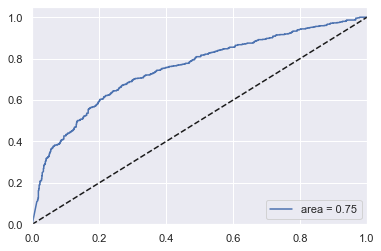

In [48]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
pred_probas = lr.predict_proba(test_vecs)[:,1]
fpr,tpr,_ = roc_curve(y_test, pred_probas)
roc_auc = auc(fpr,tpr)
plt.plot(fpr,tpr,label='area = %.2f' %roc_auc)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.legend(loc='lower right')
plt.show()

# Naive Bayes

In [49]:
from sklearn.naive_bayes import MultinomialNB

mnb_clf = MultinomialNB()
mnb_clf.fit(x_train_onehot,y_train)
mnb_pred = mnb_clf.predict(x_val_onehot)

print('accuracy score: ',accuracy_score(mnb_pred,y_val))
print(classification_report(y_val,mnb_pred))

logloss_mnb = log_loss(y_val,mnb_clf.predict_proba(x_val_onehot))
print('logloss_mnb:',logloss_mnb)

accuracy score:  0.572554169402495
              precision    recall  f1-score   support

           0       0.59      0.81      0.68       874
           1       0.50      0.25      0.34       649

    accuracy                           0.57      1523
   macro avg       0.55      0.53      0.51      1523
weighted avg       0.55      0.57      0.54      1523

logloss_mnb: 0.7088983397085811


# Random Forest

In [50]:
rf_clf = RandomForestClassifier(random_state=0,n_estimators=100,max_depth=None,verbose=0,n_jobs=-1)
rf_clf.fit(x_train_onehot,y_train)
rf_pred = rf_clf.predict(x_val_onehot)

print('accuracy score: ',accuracy_score(rf_pred,y_val))
print(classification_report(y_val,rf_pred))

logloss_rf = log_loss(y_val,rf_clf.predict_proba(x_val_onehot))
print('logloss_rf:',logloss_rf)

accuracy score:  0.5581089954038083
              precision    recall  f1-score   support

           0       0.59      0.75      0.66       874
           1       0.47      0.31      0.37       649

    accuracy                           0.56      1523
   macro avg       0.53      0.53      0.52      1523
weighted avg       0.54      0.56      0.54      1523

logloss_rf: 0.8458298212364489
